#### Fetching the pre trained model

In [1]:
!git clone https://github.com/AshishJangra27/Face-Generator-with-GAN

Cloning into 'Face-Generator-with-GAN'...
Updating files:  70% (7/10)
Updating files:  80% (8/10)
Updating files:  90% (9/10)
Updating files: 100% (10/10)
Updating files: 100% (10/10), done.


In [15]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

generator = tf.keras.models.load_model('./Face-Generator-with-GAN/generator_700.h5', compile=False)

#### Gnerating the images

(np.float64(-0.5), np.float64(127.5), np.float64(127.5), np.float64(-0.5))

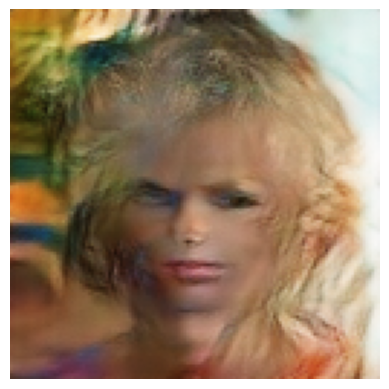

In [19]:
noise = tf.random.normal([1, 100])
# noise += .5

with tf.device('/CPU:0'):
    generated_images = generator(noise, training=False)

generated_images = (generated_images + 1) / 2.0

plt.imshow(generated_images[0])
plt.axis('off')

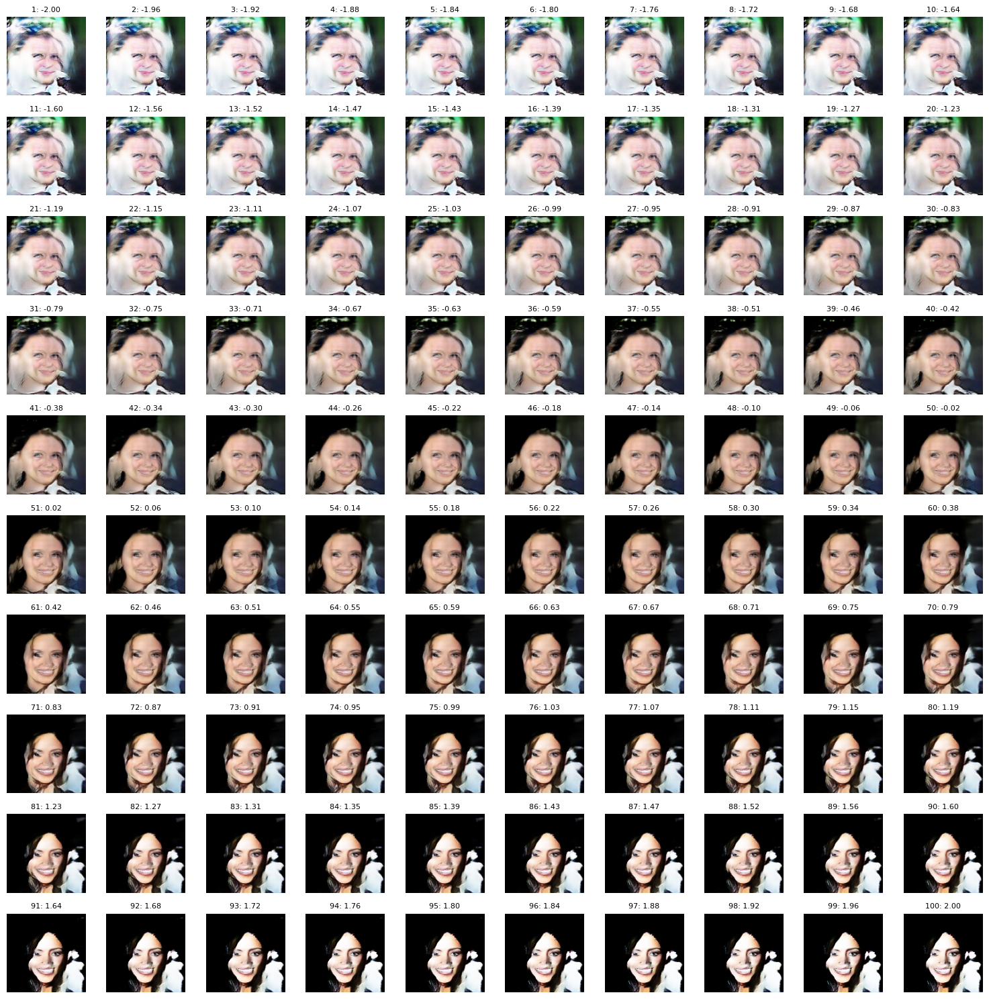

In [20]:
def generate_variations(model, noise_dim=100, num_variations=100):

    base_noise = tf.random.normal([1, noise_dim])

    noise_modifications = np.linspace(-2, 2, num_variations)

    fig, axes = plt.subplots(10, 10, figsize=(15, 15))  # 10 rows, 10 columns

    for i, noise_offset in enumerate(noise_modifications):
        variation_noise = base_noise + noise_offset

        with tf.device('/CPU:0'):
            generated_image = model(variation_noise, training=False)

        generated_image = (generated_image + 1) / 2.0

        ax = axes[i // 10, i % 10]
        ax.imshow(generated_image[0])
        ax.axis('off')
        ax.set_title(f"{i+1}: {noise_offset:.2f}", fontsize=8)

    plt.tight_layout()
    plt.show()

# Generate and display variations
generate_variations(generator)

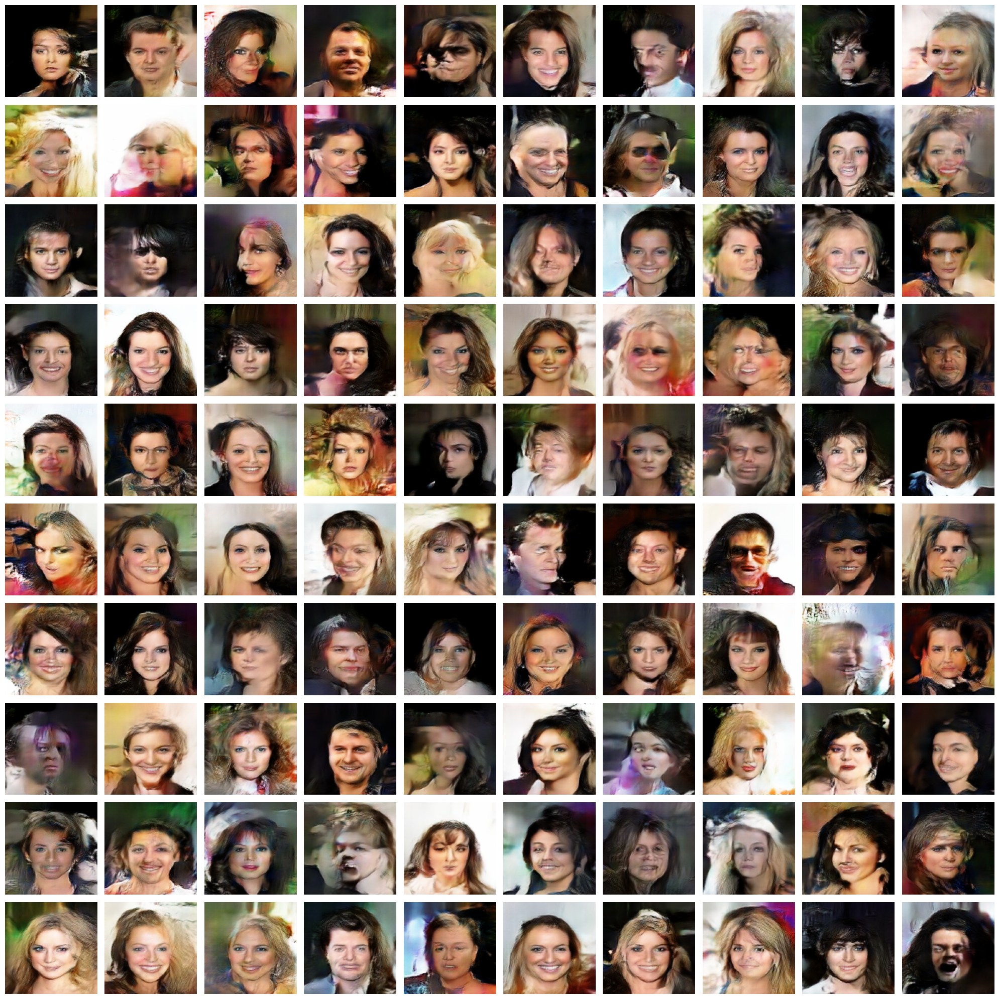

In [23]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

def generate_random_grid(model, noise_dim=100, rows=10, cols=10):
    n = rows * cols
    noises = tf.random.normal([n, noise_dim])
    with tf.device('/CPU:0'):
        generated = model(noises, training=False)
    generated = (generated + 1) / 2.0  # rescale to [0,1]
    generated = generated.numpy()

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))
    for i in range(n):
        r, c = divmod(i, cols)
        axes[r, c].imshow(generated[i])
        axes[r, c].axis('off')
    plt.tight_layout()
    plt.show()

# Generate 10x10 distinct images
generate_random_grid(generator)